In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [2]:
one_exp1 = pd.read_csv("../../ExperimentScripts/OneChannel_Exp1_SmallGPU/progress.csv")
one_exp2 = pd.read_csv("../../ExperimentScripts/OneChannel_Exp2_SmallGPU/progress.csv")

# Only 1, 3 and 4 interesting
two_exp1 = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp1_SmallGPU/progress.csv")

exp_3_first = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp3_BigGPU/progress_old_60k.csv")
exp_3_sec = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp3_BigGPU/progress_old_110k.csv")
exp_3_third = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp3_BigGPU/progress_old_170k.csv")
exp_3_fourth = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp3_BigGPU/progress.csv")
two_exp3 =  pd.concat([exp_3_first, exp_3_sec, exp_3_third, exp_3_fourth]).reset_index(drop=True)
two_exp3 = two_exp3.drop_duplicates(subset="step", keep="last")

exp_3_first = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp4_BigGPU/progress_old_10k.csv")
exp_3_sec = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp4_BigGPU/progress_old_20k.csv")
exp_3_third = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp4_BigGPU/progress_old_30k.csv")
exp_3_fourth = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp4_BigGPU/progress_old_50k.csv")
exp_3_fifth = pd.read_csv("../../ExperimentScripts/TwoChannel_Exp4_BigGPU/progress.csv")
two_exp4 = pd.concat([exp_3_first, exp_3_sec, exp_3_third, exp_3_fourth, exp_3_fifth]).reset_index(drop=True)
two_exp4 = two_exp4.drop_duplicates(subset="step", keep="last")

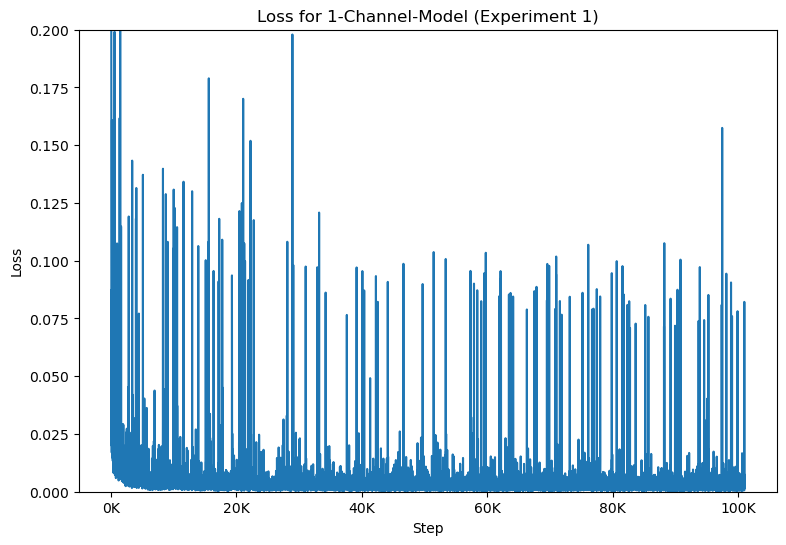

In [3]:
prog = one_exp1
name = "1-Channel-Model (Experiment 1)"
start = 0
plt.figure(figsize=(9,6))
plt.plot(prog.step, prog.loss)
plt.ylim(0,0.2)
plt.xlabel("Step")
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000) + 'K'))
plt.title(f"Loss for {name}")
plt.ylabel("Loss")

#plt.subplots_adjust(wspace=0, hspace=0)
#plt.tight_layout()
plt.savefig(fname=f"img/{name}", dpi=plt.gcf().dpi, bbox_inches='tight')

In [4]:
import numpy as np

# Normalize each point to num of seen pics
def get_loss_with_num_pics(loss_array, batch_size, save_interval=10):
    n_steps = len(loss_array)
    steps = np.arange(1,n_steps+1,1)*save_interval
    seen_pics = steps * batch_size
    return seen_pics, loss_array

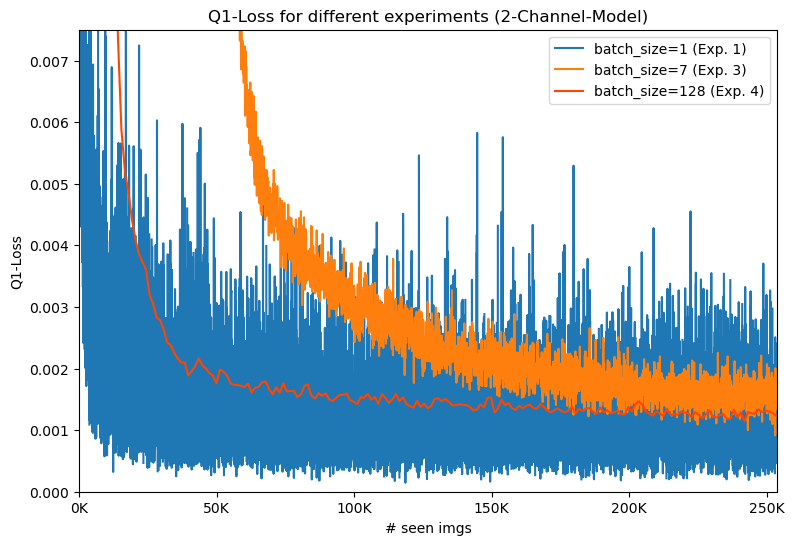

In [5]:
import matplotlib.ticker as ticker

start_from = 00000
to_plot_1 = two_exp1.loss_q1
to_plot_2 = two_exp3.loss_q1
to_plot_3 = two_exp4.loss_q1
seen_pics_1, loss_1 = get_loss_with_num_pics(to_plot_1, batch_size=1)
seen_pics_2, loss_2 = get_loss_with_num_pics(to_plot_2, batch_size=7)
seen_pics_3, loss_3 = get_loss_with_num_pics(to_plot_3, batch_size=128)

seen_pics_1_fin, loss_1_fin = seen_pics_1[seen_pics_1>start_from], loss_1[seen_pics_1>start_from]
seen_pics_2_fin, loss_2_fin = seen_pics_2[seen_pics_2>start_from], loss_2[seen_pics_2>start_from]
seen_pics_3_fin, loss_3_fin = seen_pics_3[seen_pics_3>start_from], loss_3[seen_pics_3>start_from]

end_at = min(seen_pics_3.max(), seen_pics_2.max(), seen_pics_1.max())

plt.figure(figsize=(9,6))
plt.plot(seen_pics_1_fin, loss_1_fin, label="batch_size=1 (Exp. 1)")
plt.plot(seen_pics_2_fin, loss_2_fin, label="batch_size=7 (Exp. 3)")
plt.plot(seen_pics_3_fin, loss_3_fin, label="batch_size=128 (Exp. 4)", c="orangered")
plt.xlabel("# seen imgs")
plt.ylabel("Q1-Loss")
plt.xlim((start_from, end_at))
plt.ylim((0,0.0075))
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000) + 'K'))
# plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000000) + 'M'))
plt.legend()
plt.title("Q1-Loss for different experiments (2-Channel-Model)")
plt.savefig(fname=f"img/batch_size_loss", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()

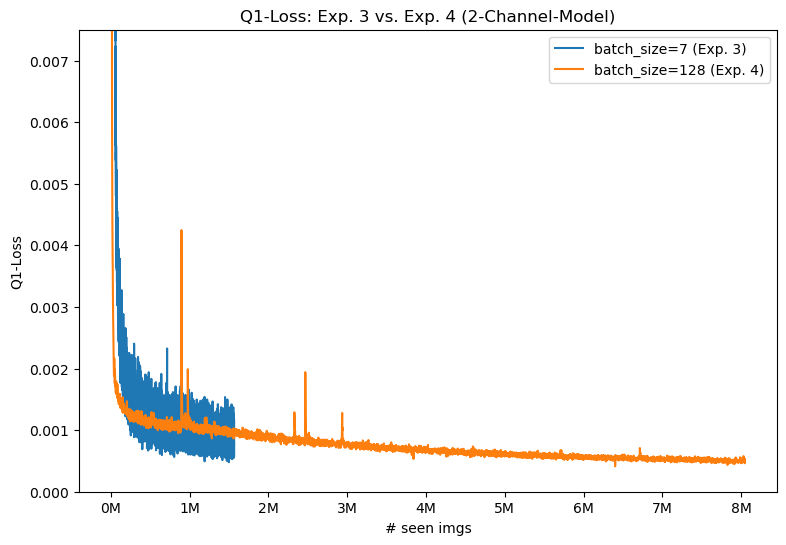

In [6]:
start_from = 00000
to_plot_1 = two_exp1.loss_q1
to_plot_2 = two_exp3.loss_q1
to_plot_3 = two_exp4.loss_q1
seen_pics_1, loss_1 = get_loss_with_num_pics(to_plot_1, batch_size=1)
seen_pics_2, loss_2 = get_loss_with_num_pics(to_plot_2, batch_size=7)
seen_pics_3, loss_3 = get_loss_with_num_pics(to_plot_3, batch_size=128)

seen_pics_1_fin, loss_1_fin = seen_pics_1[seen_pics_1>start_from], loss_1[seen_pics_1>start_from]
seen_pics_2_fin, loss_2_fin = seen_pics_2[seen_pics_2>start_from], loss_2[seen_pics_2>start_from]
seen_pics_3_fin, loss_3_fin = seen_pics_3[seen_pics_3>start_from], loss_3[seen_pics_3>start_from]

end_at = min(seen_pics_3.max(), seen_pics_2.max(), seen_pics_1.max())

plt.figure(figsize=(9,6))
plt.plot(seen_pics_2_fin, loss_2_fin, label="batch_size=7 (Exp. 3)")
plt.plot(seen_pics_3_fin, loss_3_fin, label="batch_size=128 (Exp. 4)",)
plt.xlabel("# seen imgs")
plt.ylabel("Q1-Loss")
#plt.xlim((start_from, end_at))
plt.ylim((0,0.0075))
#plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000) + 'K'))
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000000) + 'M'))
plt.legend()
plt.title("Q1-Loss: Exp. 3 vs. Exp. 4 (2-Channel-Model)")
plt.savefig(fname=f"img/batch_size_loss_full_34", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()

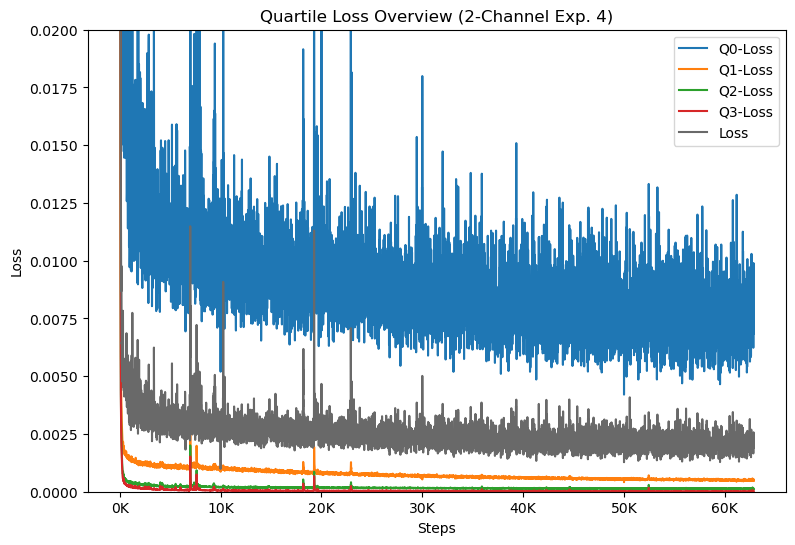

In [7]:
plt.figure(figsize=(9,6))
plt.title("Quartile Loss Overview (2-Channel Exp. 4)")
plt.plot(two_exp4.step, two_exp4.loss_q0, label="Q0-Loss")
plt.plot(two_exp4.step, two_exp4.loss_q1, label="Q1-Loss")
plt.plot(two_exp4.step, two_exp4.loss_q2, label="Q2-Loss")
plt.plot(two_exp4.step, two_exp4.loss_q3, label="Q3-Loss")
plt.plot(two_exp4.step, two_exp4.loss, label="Loss", c="dimgrey")
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000) + 'K'))
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.ylim((0, 0.02))
plt.savefig(fname=f"img/all_losses", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()

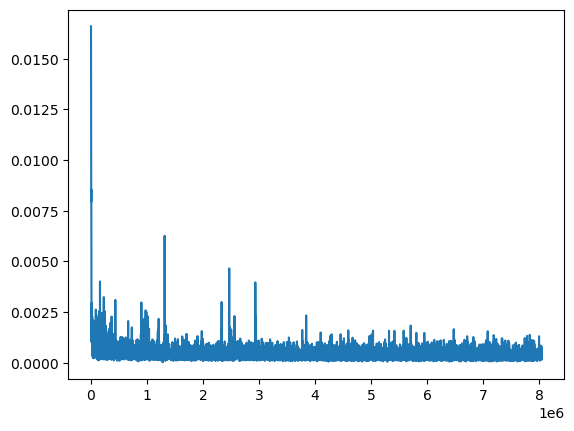

In [13]:
plt.plot(two_exp4.samples, two_exp4.vb)
#plt.ylim((0,3))

## Images

### 2Channel - Exp 4 (in directory 3)

In [75]:
def plot_model_comparison(steps, dir, batch, figsize, models=["ema_0.9999_", "model"], n_examp=2, channels=[1,0], random_seed=123, show=True):
    n_model = len(models)
    n_steps = len(steps)
    n_chan = len(channels)
    r = n_model*n_steps
    i = 1
    np.random.seed(random_seed)
    plt.figure(figsize=figsize)
    for step in steps:
        for model in models:
            if step=="060000":
                data = np.load(f'../{dir}/{model}{step}/samples_{420}x256x256x{n_chan}.npz')
            else:
                data = np.load(f'../{dir}/{model}{step}/samples_{batch}x256x256x{n_chan}.npz')
            
            batches = data[data.files[0]]
            # Sample random examples
            rand = np.random.choice(np.arange(0, batch, 1), size=n_examp, replace=False)
            for j in range(n_examp):
                ex = rand[j]
                for c in channels:
                    plt.subplot(r,n_chan*2,i)
                    plt.imshow(batches[ex,:,:,c], cmap="gray")
                    plt.xticks([])
                    plt.yticks([])
                    plt.title(f"{model[:3]}{step[:3]}K [{ex}]")
                    i += 1
    if show:
        plt.show()

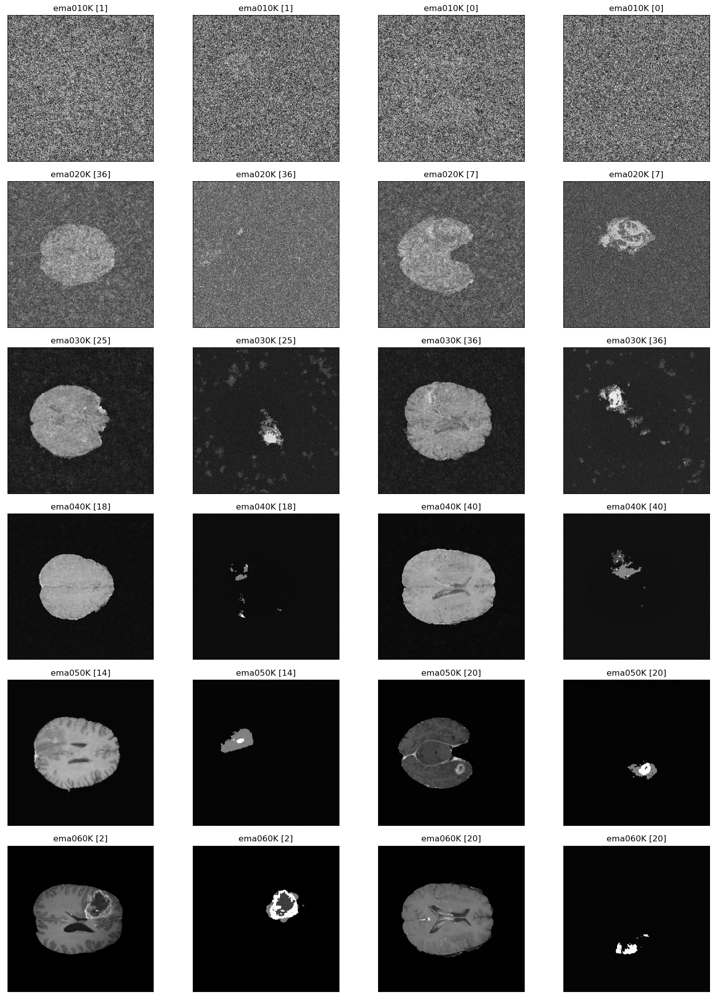

In [83]:
rs = 12312
steps = [f"0{i}0000" if i<10 else f"{i}0000" for i in range(1,7)]
plot_model_comparison(steps=steps, 
            dir="../Samples/TwoChan_Exp_3", 
            batch=42, 
            figsize=(15,20), 
            models=["ema_0.9999_"], 
            random_seed=rs,
            show=False)

plt.subplots_adjust(wspace=0.1, hspace=0)
plt.tight_layout()
plt.savefig(fname="img/TwoChan_Exp4_ema_development", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()

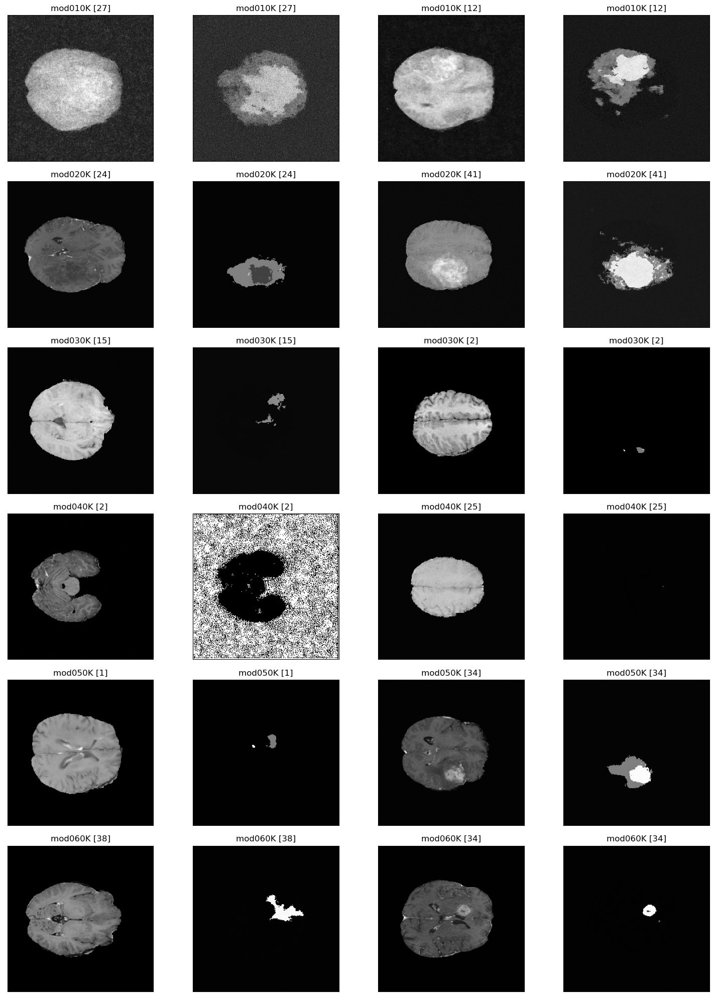

In [88]:
rs = 123
steps = [f"0{i}0000" if i<10 else f"{i}0000" for i in range(1,7)]
plot_model_comparison(steps=steps, 
            dir="../Samples/TwoChan_Exp_3", 
            batch=42, 
            figsize=(15,20), 
            models=["model"], 
            random_seed=rs,
            show=False)

plt.subplots_adjust(wspace=0.1, hspace=0)
plt.tight_layout()
plt.savefig(fname="img/TwoChan_Exp4_model_development", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()

### 2Channel - Exp 4

In [43]:
# Visualize Two Chan - Exp 4
import numpy as np
import matplotlib.pyplot as plt

step = "060000"

data = np.load(f'../../Samples/TwoChan_Exp_3/ema_0.9999_{step}/samples_420x256x256x2.npz')
# data = np.load(f'../../Samples/TwoChan_Exp_3/model{step}/samples_420x256x256x2.npz')

batches = data[data.files[0]]

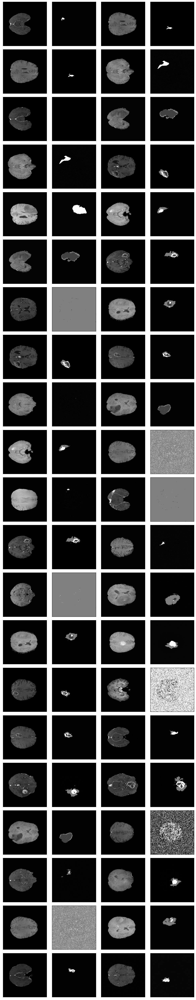

In [81]:
# First plot:
# start=106
start=280
plt.figure(figsize=(10,100))
for i in range(21):
    plt.subplot(42,4,i*4+1)
    plt.imshow(batches[i+start,:,:,1], cmap="gray")
    plt.xticks([])
    plt.yticks([])
    #plt.title(i*2+start)
    plt.subplot(42,4,i*4+2)
    plt.imshow(batches[i+start,:,:,0], cmap="gray")
    plt.xticks([])
    plt.yticks([])
    ##plt.title(i*2+start)
    plt.subplot(42,4,i*4+3)
    plt.imshow(batches[i*2+start+1,:,:,1], cmap="gray")
    plt.xticks([])
    plt.yticks([])
    #plt.title(i*2+start+1)
    plt.subplot(42,4,i*4+4)
    plt.imshow(batches[i*2+start+1,:,:,0], cmap="gray")
    plt.xticks([])
    plt.yticks([])
    #plt.title(i*2+start+1)
plt.subplots_adjust(wspace=0.1, hspace=0)
plt.tight_layout()
#plt.savefig(fname="img/TwoChan_Exp4_60k_EMA_second", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()

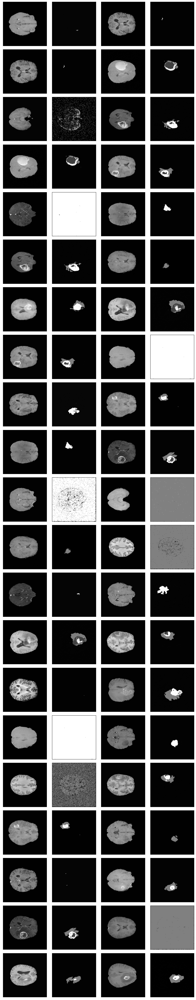

In [91]:
# First plot:
data = np.load(f'../../Samples/TwoChan_Exp_3/model{step}/samples_420x256x256x2.npz')
batches = data[data.files[0]]
# start=106
start=284
plt.figure(figsize=(10,100))
for i in range(21):
    plt.subplot(42,4,i*4+1)
    plt.imshow(batches[i+start,:,:,1], cmap="gray")
    plt.xticks([])
    plt.yticks([])
    #plt.title(i*2+start)
    plt.subplot(42,4,i*4+2)
    plt.imshow(batches[i+start,:,:,0], cmap="gray")
    plt.xticks([])
    plt.yticks([])
    ##plt.title(i*2+start)
    plt.subplot(42,4,i*4+3)
    plt.imshow(batches[i*2+start+1,:,:,1], cmap="gray")
    plt.xticks([])
    plt.yticks([])
    #plt.title(i*2+start+1)
    plt.subplot(42,4,i*4+4)
    plt.imshow(batches[i*2+start+1,:,:,0], cmap="gray")
    plt.xticks([])
    plt.yticks([])
    #plt.title(i*2+start+1)
plt.subplots_adjust(wspace=0.1, hspace=0)
plt.tight_layout()
plt.savefig(fname="img/TwoChan_Exp4_60k_MODEL", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()

### Comparison 1000 and respacing

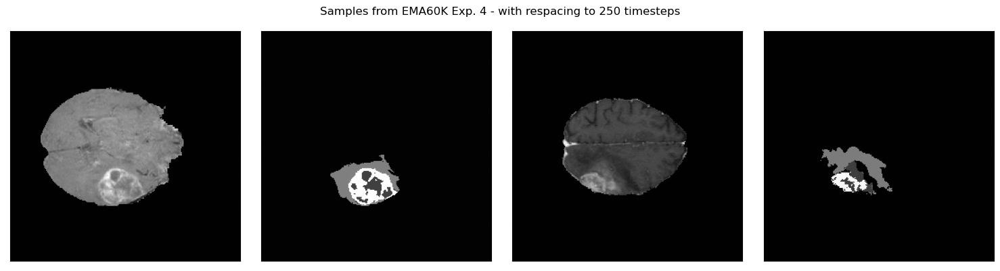

In [61]:
data_1 = np.load(f'../../Samples/TwoChan_Exp_3/ema_0.9999_060000_full_timesteps/samples_normal_42x256x256x2.npz')

batches_1 = data_1[data_1.files[0]]
#data_2 = np.load(f'../../Samples/TwoChan_Exp_3/model{step}/samples_42x256x256x2.npz')
#batches_2 = data[data.files[0]]

res_1, res_2 = batches_1[27,:,:,:], batches_1[34,:,:,:]
plt.figure(figsize=(15,4))
plt.subplot(1,4,1)
plt.imshow(res_1[:,:,1], cmap="gray")
plt.xticks([])
plt.yticks([])
plt.subplot(1,4,2)
plt.imshow(res_1[:,:,0], cmap="gray")
plt.xticks([])
plt.yticks([])
plt.subplot(1,4,3)
plt.imshow(res_2[:,:,1], cmap="gray")
plt.xticks([])
plt.yticks([])
plt.subplot(1,4,4)
plt.imshow(res_2[:,:,0], cmap="gray")
plt.xticks([])
plt.yticks([])
plt.suptitle("Samples from EMA60K Exp. 4 - with respacing to 250 timesteps")
#plt.subplots_adjust(wspace=0.1, hspace=0)
plt.tight_layout()
plt.savefig(fname="img/TwoChan_Exp4_RESPACE", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()

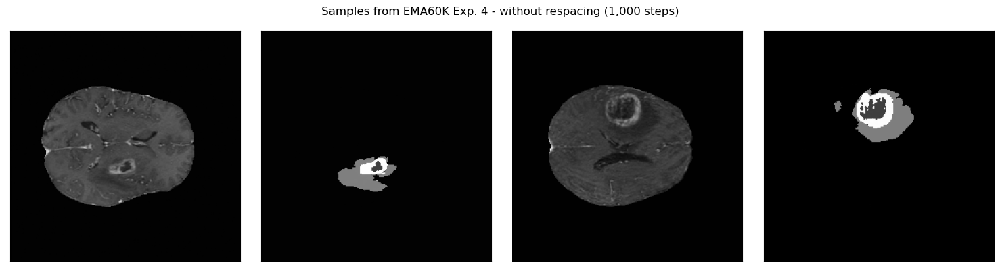

In [60]:
import numpy as np

data_1 = np.load(f'../../Samples/TwoChan_Exp_3/ema_0.9999_060000_full_timesteps/samples_norespace_42x256x256x2.npz')

batches_1 = data_1[data_1.files[0]]
#data_2 = np.load(f'../../Samples/TwoChan_Exp_3/model{step}/samples_42x256x256x2.npz')
#batches_2 = data[data.files[0]]

res_1, res_2 = batches_1[29,:,:,:], batches_1[26,:,:,:]
plt.figure(figsize=(15,4))
plt.subplot(1,4,1)
plt.imshow(res_1[:,:,1], cmap="gray")
plt.xticks([])
plt.yticks([])
plt.subplot(1,4,2)
plt.imshow(res_1[:,:,0], cmap="gray")
plt.xticks([])
plt.yticks([])
plt.subplot(1,4,3)
plt.imshow(res_2[:,:,1], cmap="gray")
plt.xticks([])
plt.yticks([])
plt.subplot(1,4,4)
plt.imshow(res_2[:,:,0], cmap="gray")
plt.xticks([])
plt.yticks([])
plt.suptitle("Samples from EMA60K Exp. 4 - without respacing (1,000 steps)")
#plt.subplots_adjust(wspace=0.1, hspace=0)
plt.tight_layout()
plt.savefig(fname="img/TwoChan_Exp4_NORESPACE", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()

### Five Chan visualization

In [18]:
import numpy as np
step = "030000"

#data = np.load(f'../../Samples/FiveChan_Exp_1/ema_0.9999_{step}/samples_84x256x256x5.npz')
data = np.load(f'../../Samples/FiveChan_Exp_1/model{step}/samples_84x256x256x5.npz')

batches = data[data.files[0]]

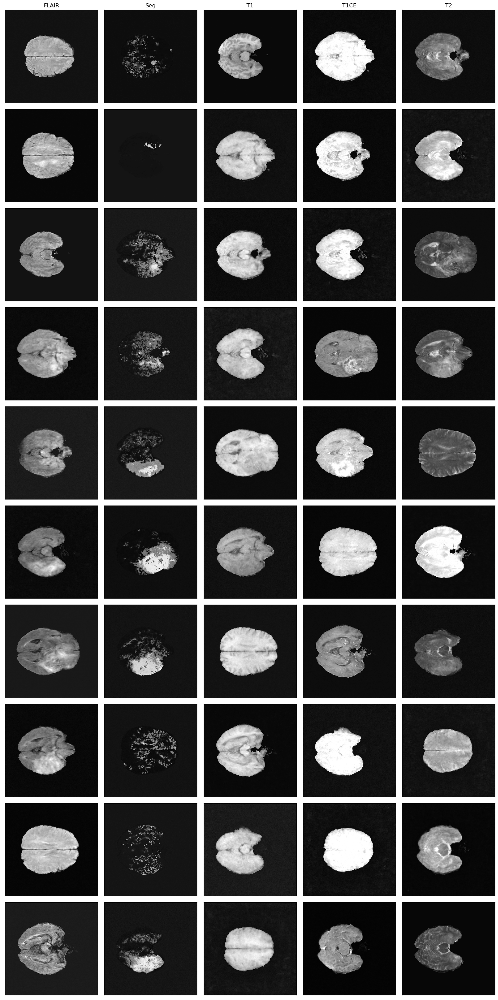

In [26]:
CHANNELS = ['FLAIR', 'Seg', 'T1', 'T1CE', 'T2']

start=40
plt.figure(figsize=(15,30))
for i in range(10):
    for j in range(5):
        plt.subplot(10,5,(i*5)+1+j)
        plt.imshow(batches[i+j+start,:,:,j], cmap="gray")
        plt.xticks([])
        plt.yticks([])
        if i == 0:
            plt.title(f"{CHANNELS[j]}")
plt.subplots_adjust(wspace=0.1, hspace=0)
plt.tight_layout()
plt.savefig(fname="img/FIVECHAN", dpi=plt.gcf().dpi, bbox_inches='tight')
plt.show()